In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split


In [ ]:
# Delete Head Landmarks they are not needed for activity recognition 
import csv
input_file = 'coords.csv'
output_file = 'output.csv'
cols_to_remove = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40] # Column indexes to be removed (starts at 0)

cols_to_remove = sorted(cols_to_remove, reverse=True) # Reverse so we remove from the end first
row_count = 0 # Current amount of rows processed

with open(input_file, "r") as source:
    reader = csv.reader(source)
    with open(output_file, "w", newline='') as result:
        writer = csv.writer(result)
        for row in reader:
            row_count += 1
            for col_index in cols_to_remove:
                del row[col_index]
            writer.writerow(row)

In [2]:
df = pd.read_csv('output.csv')

In [3]:
df.head()

,class,x11,y11,z11,v11,x12,y12,z12,v12,x13,...,z31,v31,x32,y32,z32,v32,x33,y33,z33,v33
0,Picking,0.547305,0.315745,-0.175003,0.999957,0.730885,0.398042,-0.446987,0.999952,0.560679,...,0.570741,0.826739,0.669878,0.992607,0.052675,0.977988,0.460791,0.942690,0.476205,0.937148
1,Picking,0.546206,0.313204,-0.173593,0.999923,0.730587,0.394433,-0.446910,0.999927,0.559244,...,0.581587,0.824797,0.667829,0.995995,0.090414,0.979368,0.460782,0.943267,0.488077,0.940223
2,Picking,0.547753,0.317308,-0.175358,0.999924,0.732455,0.398479,-0.454051,0.999949,0.566881,...,0.548904,0.830456,0.670413,0.993718,0.083082,0.976002,0.459872,0.941458,0.457507,0.939809
3,Picking,0.550479,0.320966,-0.177470,0.999924,0.732068,0.398361,-0.464355,0.999959,0.568856,...,0.606909,0.825059,0.659467,0.992808,0.044236,0.980271,0.462996,0.940405,0.519571,0.941725
4,Picking,0.551220,0.321359,-0.181044,0.999925,0.732186,0.398777,-0.465209,0.999959,0.568562,...,0.601391,0.816281,0.660647,0.991133,0.074666,0.978510,0.462867,0.941011,0.514359,0.938083


In [4]:
df.tail()

,class,x11,y11,z11,v11,x12,y12,z12,v12,x13,...,z31,v31,x32,y32,z32,v32,x33,y33,z33,v33
57868,Walking,0.454258,0.230499,-0.088437,0.999990,0.506950,0.276883,-0.244610,1.000000,0.483365,...,0.331682,0.974676,0.361806,0.862232,0.004522,0.995819,0.564548,0.864127,0.301990,0.971323
57869,Walking,0.450291,0.226566,-0.079401,0.999992,0.501980,0.277028,-0.240720,0.999999,0.479811,...,0.290501,0.976985,0.372028,0.881828,-0.055624,0.996453,0.575478,0.875382,0.259964,0.975306
57870,Walking,0.452843,0.238192,-0.074470,0.999987,0.504780,0.284571,-0.234711,0.999999,0.485551,...,0.275841,0.981452,0.375522,0.867552,-0.021315,0.995854,0.579879,0.862999,0.249341,0.977888
57871,Walking,0.449490,0.235738,-0.076541,0.999973,0.499697,0.281367,-0.241066,0.999999,0.483954,...,0.259950,0.977373,0.386539,0.879482,0.056895,0.992508,0.588803,0.876589,0.232210,0.971662
57872,Walking,0.384577,0.192560,-0.052314,0.999968,0.358924,0.250709,0.196661,0.999417,0.341269,...,-0.020133,0.954754,0.514225,0.926339,0.061978,0.970882,0.290143,0.983232,-0.115114,0.989785


In [3]:
X = df.drop('class', axis=1) # features
y = df['class'] # target value

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=1234) #1234

In [5]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler 
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

In [12]:
import pandas as pd
import numpy as np
feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestClassifier(random_state=42, n_estimators=1000)
forest.fit(X_train, y_train)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)

In [14]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(480, 320))
plot_tree(forest.estimators_[0], 
          feature_names=X.columns,
          class_names=df['class'].unique(), 
          filled=True, rounded=True)
plt.show()

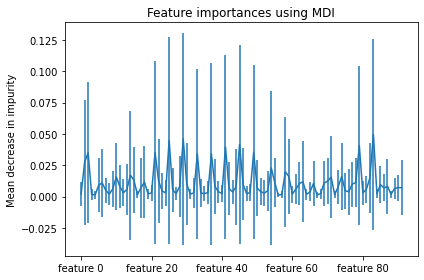

In [15]:
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.line (yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [33]:
# check Important features
feature_importances_df = pd.DataFrame(
    {"feature": list(X.columns), "importance": importances}
).sort_values("importance", ascending=False)

# Display
feature_importances_df

,feature,importance
83,v31,0.049632
29,y18,0.046064
25,y17,0.044917
45,y22,0.041505
79,v30,0.040751
...,...,...
16,x15,0.001543
3,v11,0.001509
4,x12,0.001402
67,v27,0.001298


In [8]:
pipelines = {
    'rf':make_pipeline(StandardScaler(), RandomForestClassifier(random_state=42))
}

In [9]:
fit_models = {}
for algo, pipeline in pipelines.items():
    # Input
    model = pipeline.fit(X_train, y_train)
    # Output
    fit_models[algo] = model

In [32]:
fit_models

{'rf': Pipeline(steps=[('standardscaler', StandardScaler()),
                 ('randomforestclassifier',
                  RandomForestClassifier(random_state=42))])}

In [13]:
fit_models['rf'].predict(X_test)

array(['Picking', 'Standing', 'Picking', ..., 'Picking', 'Standing',
       'Picking'], dtype=object)

In [34]:
y_test

1517      Picking
25019    Standing
7875      Picking
13765     Picking
24403    Standing
           ...   
9350      Picking
44394     Walking
12303     Picking
35387    Standing
9927      Picking
Name: class, Length: 8681, dtype: object

In [35]:
from sklearn.metrics import accuracy_score # Accuracy metrics 
from sklearn.metrics import precision_score # Precision metrics
from sklearn.metrics import recall_score # Recall metrics
from sklearn.metrics import f1_score # F1 metrics
from sklearn.metrics import confusion_matrix # Confusion matrix
from sklearn.metrics import ConfusionMatrixDisplay # Confusion matrix display
from sklearn.metrics import classification_report # Classification report
from sklearn.metrics import mean_absolute_error # Mean absolute error
from sklearn.metrics import mean_squared_error # Mean squared error
from sklearn.metrics import roc_auc_score # ROC AUC score
import pickle 
import numpy as np

rf


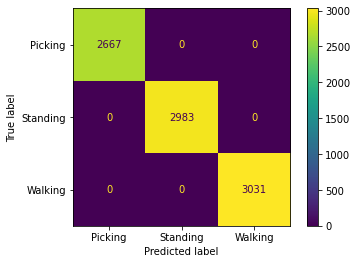

In [36]:
# Confusion matrix
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    # Precision metrics
    print(algo)
    cm = confusion_matrix(y_test, yhat, labels=model.classes_)
    disp = ConfusionMatrixDisplay(cm, display_labels=model.classes_)
    disp.plot()

In [37]:
# ROC AUC Score
for algo, model in fit_models.items():
    yhat = model.predict_proba(X_test)    
    print(roc_auc_score(y_test, yhat, multi_class='ovo'))

1.0


In [38]:
# Balanced Accuracy
from sklearn.metrics import balanced_accuracy_score
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    print(balanced_accuracy_score(y_test, yhat))

1.0


In [39]:
# Mean absolute error
# Mean squared error
# Root mean squared error
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    ytest = pd.factorize(y_test)[0]
    ypred = pd.factorize(yhat)[0]
    # Precision metrics
    print(algo)
    print(mean_absolute_error(ytest, ypred))
    print(mean_squared_error(ytest, ypred))
    print(np.sqrt(mean_squared_error(ytest, ypred)))
    

rf
0.0
0.0
0.0


In [40]:
# Confusion matrix
for algo, model in fit_models.items():
    yhat = model.predict(X_test) 
    print(algo)
    print(classification_report(y_test, yhat))

rf
              precision    recall  f1-score   support

     Picking       1.00      1.00      1.00      2667
    Standing       1.00      1.00      1.00      2983
     Walking       1.00      1.00      1.00      3031

    accuracy                           1.00      8681
   macro avg       1.00      1.00      1.00      8681
weighted avg       1.00      1.00      1.00      8681



In [41]:
# Accuracy metrics
for algo, model in fit_models.items():
    yhat = model.predict(X_test)
    print(algo, accuracy_score(y_test, yhat))

rf 1.0


In [42]:
# Precision metrics
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    # Precision metrics
    print(algo, precision_score(y_test, yhat, average='macro'))

rf 1.0


In [43]:
# Precision metrics
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    # Precision metrics
    print(precision_score(y_test, yhat, average='macro'))

1.0


In [44]:
# Recall metrics
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    # Recall metrics
    print(algo, recall_score(y_test, yhat, average='macro'))
    

rf 1.0


In [45]:
# F1 Score metrics
for algo, model in fit_models.items():
    yhat = model.predict(X_test)    
    # F1 metrics
    print(algo, f1_score(y_test, yhat, average='macro'))

rf 1.0


In [46]:
fit_models['rf'].predict(X_test)

array(['Picking', 'Standing', 'Picking', ..., 'Picking', 'Standing',
       'Picking'], dtype=object)

In [47]:
y_test

1517      Picking
25019    Standing
7875      Picking
13765     Picking
24403    Standing
           ...   
9350      Picking
44394     Walking
12303     Picking
35387    Standing
9927      Picking
Name: class, Length: 8681, dtype: object

In [ ]:
with open('rf100.pkl', 'wb') as f:
    pickle.dump(fit_models['rf'], f)